# **Clasificación de Razas de Mascotas con Transfer Learning**
Pryecto de deep learning - Oriol Fernando Palacios Durand

Este notebook presenta un estudio comparativo de tres modelos de Redes Neuronales Convolucionales (CNN) preentrenados (MobileNetV2, EfficientNetB0, y ResNet50) para la clasificación de 37 razas de mascotas del dataset Oxford-IIIT Pet. Se utiliza la técnica de Transfer Learning y Fine-Tuning.



## 1. **Configuración de entorno**

###1.1 **Instalación de librerías**

###1.2 **Importación de Módulos**

In [ ]:
# Módulos principales
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import random
import os

# Módulos de Keras
from tensorflow.keras import layers
from tensorflow.keras.models import Model
from tensorflow.keras.applications import MobileNetV2, EfficientNetB0, ResNet50
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, CSVLogger

# Preprocesadores especificos por arquitectura
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input as mobilenet_preprocess
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess
from tensorflow.keras.applications.resnet import preprocess_input as resnet_preprocess

# Módulos de Scikit-learn para evaluación
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix

print("TensorFlow Version:", tf.__version__)

TensorFlow Version: 2.19.0


###1.3 **Conexión con Google Drive**

In [ ]:
# Montar Google Drive para guardar modelos y resultados
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# Definir rutas del proyecto (¡muy importante!)
PATH_PROYECTO = '/content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/'
PATH_RESULTS = os.path.join(PATH_PROYECTO, 'results/')

# Crear la carpeta de resultados si no existe
os.makedirs(PATH_RESULTS, exist_ok=True)

Mounted at /content/drive


### 1.4 **Configuración Global y Reproducibilidad**

Se usan las siguientes configuraciones para asegurar la reproducibilidad de los experimentos, así como para establecer los criterios globales de prueba
* Número de clases: 37, según el tipo de mascotas del dataset
* Tamaño de imagen
* Splits: 70% para entrenamiento, 15% para validación y el otro 15% para prueba
* Hiperparámetros para la fase de transfer learning y la de fine-tuning
* Finalmente, una configuración propia para la aceleración del entrenamiento

In [ ]:
# Semilla para reproducibilidad
SEED = 42
tf.random.set_seed(SEED)
np.random.seed(SEED)
random.seed(SEED)

# Hiperparámetros globales
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
N_CLASSES = 37  # Para Oxford-IIIT Pet
SPLITS = ['train[:70%]', 'train[70%:85%]', 'train[85%:]'] # 70/15/15 split

# Fase 1 (Transfer Learning)
EPOCHS_TL = 10
LR_TL = 1e-3

# Fase 2 (Fine-Tuning)
EPOCHS_FT = 10
LR_FT = 1e-5

# Configuración de Mixed Precision para acelerar el entrenamiento en GPUs compatibles
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy('mixed_float16')

### 1.5 **Verificación de GPU**

In [ ]:
!nvidia-smi

gpu_devices = tf.config.list_physical_devices('GPU')
if gpu_devices:
    details = tf.config.experimental.get_device_details(gpu_devices[0])
    print("\nGPU encontrada:", details.get('device_name', 'N/A'))
else:
    print("\nNo se encontró ninguna GPU. El entrenamiento se ejecutará en CPU.")

Mon Aug 25 03:12:15 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   49C    P0             27W /   70W |    1232MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

## 2. **Pipeline de datos**

Carga, preprocesamiento y optimización del dataset *Oxford-IIIT Pet* utilizando *tensorflow_datasets* y la API tf.data para un rendimiento eficiente.


### 2.1 **Carga del dataset**

In [ ]:
# Cargar el dataset desde TFDS
(ds_train_raw, ds_val_raw, ds_test_raw), ds_info = tfds.load(
    'oxford_iiit_pet',
    split=SPLITS,
    with_info=True,
    as_supervised=True, # se retornan tuplas de imagen - clase, para el trabajo de clasificación
    shuffle_files=True
)

# Imprimir información clave del dataset
print("Número de clases:", ds_info.features['label'].num_classes)
print("Nombres de las clases:", ds_info.features['label'].names)

Número de clases: 37
Nombres de las clases: ['Abyssinian', 'american_bulldog', 'american_pit_bull_terrier', 'basset_hound', 'beagle', 'Bengal', 'Birman', 'Bombay', 'boxer', 'British_Shorthair', 'chihuahua', 'Egyptian_Mau', 'english_cocker_spaniel', 'english_setter', 'german_shorthaired', 'great_pyrenees', 'havanese', 'japanese_chin', 'keeshond', 'leonberger', 'Maine_Coon', 'miniature_pinscher', 'newfoundland', 'Persian', 'pomeranian', 'pug', 'Ragdoll', 'Russian_Blue', 'saint_bernard', 'samoyed', 'scottish_terrier', 'shiba_inu', 'Siamese', 'Sphynx', 'staffordshire_bull_terrier', 'wheaten_terrier', 'yorkshire_terrier']


### 2.2 Visualización del dataset

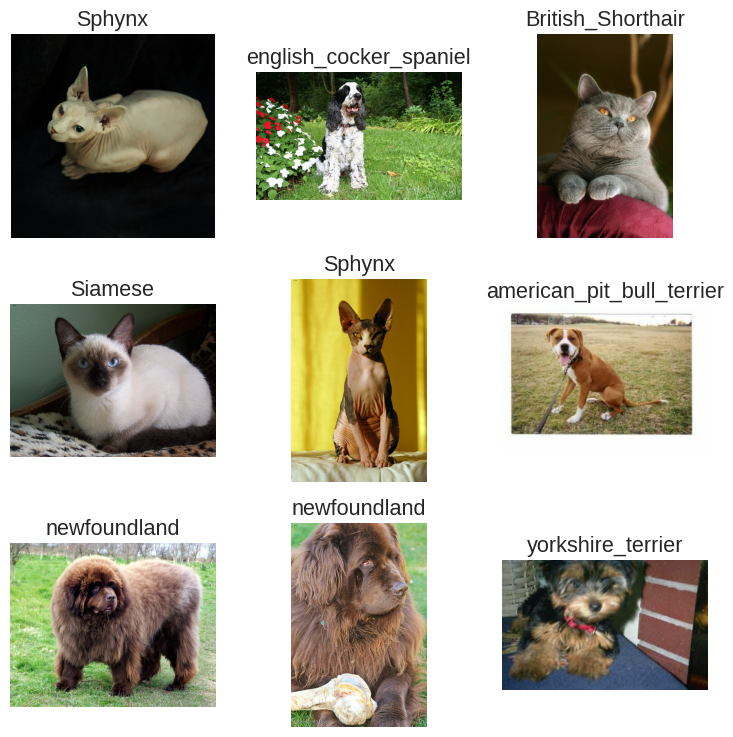

In [ ]:
# Función para obtener los nombres de las clases
def get_class_name(label):
    return ds_info.features['label'].names[label]

# Visualización de ejemplos con etiquetas
plt.figure(figsize=(9, 9))
for i, (image, label) in enumerate(ds_train_raw.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(get_class_name(label.numpy()))
    plt.axis("off")
plt.show()

### 2.3 **Preprocesamiento y Data Augmentation**

In [ ]:
# Diccionario para mapear nombres de backbones a sus funciones de preprocesamiento
PREPROCESS_INPUT_MAP = {
    'mobilenetv2': mobilenet_preprocess,
    'efficientnetb0': efficientnet_preprocess,
    'resnet50': resnet_preprocess
}

def preprocess_image(image, label, backbone_name, training=False):
    """
    Preprocesa una imagen: redimensiona, aplica data augmentation (opcional)
    y luego aplica la normalización específica del backbone.
    """
    # 1. Redimensionar la imagen
    image = tf.image.resize(image, IMG_SIZE)

    # 2. Data Augmentation (si es para entrenamiento)
    if training:
        image = tf.image.random_flip_left_right(image)
        image = tf.image.random_brightness(image, max_delta=0.2)
        image = tf.image.random_contrast(image, lower=0.8, upper=1.2)

    # 3. Aplicar la función de preprocesamiento específica del backbone
    preprocess_fn = PREPROCESS_INPUT_MAP[backbone_name]
    image = preprocess_fn(image)

    # 4. One-hot encode la etiqueta
    label = tf.one_hot(label, N_CLASSES)

    return image, label

def create_dataset(ds_raw, backbone_name, training=False):
    """
    Crea un pipeline de tf.data optimizado aplicando el preprocesamiento
    específico para un backbone dado.
    """
    # Usar una lambda para pasar el argumento extra 'backbone_name' a la función map
    ds = ds_raw.map(lambda img, lbl: preprocess_image(img, lbl, backbone_name, training),
                    num_parallel_calls=tf.data.AUTOTUNE)

    if training:
        ds = ds.shuffle(1024, seed=SEED)

    ds = ds.batch(BATCH_SIZE)
    ds = ds.prefetch(buffer_size=tf.data.AUTOTUNE)

    return ds

## **3. Construcción y entrenamiento de modelos**

### 3.1 **Constructor de modelos universal**

In [ ]:
def build_model(backbone_name, input_shape=(224, 224, 3), n_classes=37, trainable=False):
    """
    Construye un modelo de clasificación a partir de un backbone preentrenado.

    Args:
        backbone_name (str): Nombre del modelo base ('mobilenetv2', 'efficientnetb0', 'resnet50').
        input_shape (tuple): Dimensiones de la imagen de entrada.
        n_classes (int): Número de clases de salida.
        trainable (bool): Si el backbone debe ser entrenable (para Fine-Tuning).

    Returns:
        tf.keras.Model: El modelo de Keras compilado.
    """

    if backbone_name == 'mobilenetv2':
        base_model = MobileNetV2(input_shape=input_shape,
                                include_top=False,
                                weights='imagenet')
    elif backbone_name == 'efficientnetb0':
        base_model = EfficientNetB0(input_shape=input_shape,
                                   include_top=False,
                                   weights='imagenet')
    elif backbone_name == 'resnet50':
        base_model = ResNet50(input_shape=input_shape,
                             include_top=False,
                             weights='imagenet')
    else:
        raise ValueError(f"Backbone {backbone_name} no soportado")

    base_model.trainable = trainable

    # Cabeza clasificadora común
    inputs = tf.keras.Input(shape=input_shape)
    x = base_model(inputs, training=False)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    x = tf.keras.layers.Dropout(0.3)(x)
    outputs = tf.keras.layers.Dense(n_classes,
                                   activation='softmax',
                                   dtype='float32')(x)  # Para mixed precision.
                                   # Habilitar mixed precision para acelerar el entrenamiento en GPUs compatibles sin pérdida significativa de precisión.

    model = tf.keras.Model(inputs, outputs)
    return model


### 3.2 **Configuración de callbacks**

In [ ]:
def get_callbacks(model_name, phase='TL'):
    """
    Configura y retorna una lista de callbacks de Keras estándar para el entrenamiento.

    Estos callbacks incluyen:
    - EarlyStopping: Detiene el entrenamiento si la métrica monitoreada no mejora.
    - ReduceLROnPlateau: Reduce la tasa de aprendizaje si la métrica monitoreada se estanca.
    - CSVLogger: Registra las métricas de entrenamiento y validación en un archivo CSV.
    - ModelCheckpoint: Guarda el modelo (o solo los pesos) con el mejor rendimiento.

    Args:
        model_name (str): Nombre del modelo que se está entrenando (ej. 'mobilenetv2').
        phase (str): Fase de entrenamiento ('TL' para Transfer Learning, 'FT' para Fine-Tuning).
                     Se usa para nombrar los archivos de log y checkpoint.

    Returns:
        list: Una lista de objetos tf.keras.callbacks.Callback configurados.
    """
    return [
        tf.keras.callbacks.EarlyStopping(
            monitor='val_accuracy',
            patience=5,
            restore_best_weights=True
        ),
        tf.keras.callbacks.ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=2,
            min_lr=1e-7
        ),
        tf.keras.callbacks.CSVLogger(os.path.join(PATH_RESULTS, f'{model_name}_{phase}.csv')),
        tf.keras.callbacks.ModelCheckpoint(
            os.path.join(PATH_RESULTS, f'{model_name}_{phase}_best.keras'),
            monitor='val_accuracy',
            save_best_only=True
        )
    ]

###3.3. **Protocolo de Entrenamiento Completo (TL + FT)**


In [ ]:
def train_model_complete(backbone_name, ds_train_raw, ds_val_raw):
    """
    Realiza un proceso de entrenamiento completo para un modelo de clasificación de imágenes,
    combinando Transfer Learning (TL) y Fine-Tuning (FT).

    Args:
        backbone_name (str): El nombre del modelo base (backbone) a utilizar
                             ('mobilenetv2', 'efficientnetb0', 'resnet50').
        ds_train_raw (tf.data.Dataset): El dataset de entrenamiento sin preprocesar.
        ds_val_raw (tf.data.Dataset): El dataset de validación sin preprocesar.

    Returns:
        tuple: Una tupla que contiene:
               - model (tf.keras.Model): El modelo entrenado.
               - history_tl (History): El objeto History del entrenamiento de Transfer Learning.
               - history_ft (History): El objeto History del entrenamiento de Fine-Tuning.
               - metrics_after_ft (dict): Un diccionario con la métrica de exactitud del
                                          entrenamiento después del Fine-Tuning.
    """

    print(f"\n{'='*60}")
    print(f"🚀 Iniciando entrenamiento de {backbone_name}")
    print(f"{'='*60}")

    # --- Creación dinámica del pipeline de datos con el preprocesamiento correcto ---
    print(f"🔧 Creando pipeline de datos para '{backbone_name}'...")
    train_ds = create_dataset(ds_train_raw, backbone_name, training=True)
    val_ds = create_dataset(ds_val_raw, backbone_name, training=False)
    # Create a training dataset without shuffling for evaluation purposes
    train_ds_eval = create_dataset(ds_train_raw, backbone_name, training=False)


    # Fase 1: Transfer Learning
    print("\n📚 Fase 1: Transfer Learning (backbone congelado)")
    model = build_model(backbone_name, trainable=False)
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=LR_TL),
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.1),
        metrics=['accuracy']
    )
    history_tl = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS_TL,
        callbacks=get_callbacks(backbone_name, 'TL')
    )

    # Fase 2: Fine-Tuning
    print("\n🎯 Fase 2: Fine-Tuning (descongelar capas)")
    unfreeze_layers = {'mobilenetv2': 20, 'efficientnetb0': 30, 'resnet50': 40} # Diccionario para descongelar aprox. el último 10-15% de capas de cada backbone para el Fine-Tuning.
    base_model = model.layers[1]
    base_model.trainable = True
    n_unfreeze = unfreeze_layers[backbone_name]
    for layer in base_model.layers[:-n_unfreeze]:
        layer.trainable = False
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=LR_FT),
        loss=tf.keras.losses.CategoricalCrossentropy(label_smoothing=0.05),
        metrics=['accuracy']
    )
    initial_epoch_ft = history_tl.epoch[-1] + 1
    history_ft = model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=EPOCHS_TL + EPOCHS_FT, # Entrenar hasta el número total de épocas
        initial_epoch=initial_epoch_ft,
        callbacks=get_callbacks(backbone_name, 'FT')
    )

    # Evaluate on training set after fine-tuning
    print("\n📊 Evaluando en el conjunto de entrenamiento después del Fine-Tuning...")
    train_loss, train_accuracy = model.evaluate(train_ds_eval, verbose=0)
    print(f"  - Training Loss: {train_loss:.4f}")
    print(f"  - Training Accuracy: {train_accuracy:.4f}")

    return model, history_tl, history_ft, {'train_loss': train_loss, 'train_accuracy': train_accuracy}

### **3.4. Ejecución del Entrenamiento para los 3 Modelos**

In [ ]:
# Lista de modelos a entrenar
models_to_train = ['mobilenetv2', 'efficientnetb0', 'resnet50']
models_results = {}

# Bucle principal de entrenamiento
for backbone in models_to_train:
    model, hist_tl, hist_ft, train_metrics = train_model_complete(backbone, ds_train_raw, ds_val_raw)
    models_results[backbone] = {
        'model': model,
        'history_tl': hist_tl,
        'history_ft': hist_ft,
    }
    # Guardar el modelo final entrenado
    model.save(os.path.join(PATH_RESULTS, f'{backbone}_final.keras'))


🚀 Iniciando entrenamiento de mobilenetv2
🔧 Creando pipeline de datos para 'mobilenetv2'...

📚 Fase 1: Transfer Learning (backbone congelado)
Epoch 1/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 53s 450ms/step - accuracy: 0.3842 - loss: 2.6761 - val_accuracy: 0.8569 - val_loss: 1.1511 - learning_rate: 0.0010
Epoch 2/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - accuracy: 0.8754 - loss: 1.1361 - val_accuracy: 0.8931 - val_loss: 1.0595 - learning_rate: 0.0010
Epoch 3/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.9174 - loss: 1.0217 - val_accuracy: 0.9130 - val_loss: 1.0293 - learning_rate: 0.0010
Epoch 4/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 4s 33ms/step - accuracy: 0.9400 - loss: 0.9563 - val_accuracy: 0.9167 - val_loss: 1.0087 - learning_rate: 0.0010
Epoch 5/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 27ms/step - accuracy: 0.9560 - loss: 0.9160 - val_accuracy: 0.8986 - val_loss: 1.0020 - learning_rate: 0.0010
Epoch 6/10
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - accuracy: 0.9688 - loss: 0.8862 - val_accuracy: 

## **4. Evaluación y Comparación de Modelos**

Evaluación rigurosa de los modelos entrenados sobre el conjunto de test. Se calculan múltiples métricas, se generan visualizaciones y se identifica el modelo con mejor rendimiento.


### **4.1. Función de Evaluación Comprensiva**

In [ ]:
def evaluate_on_dataset(model, dataset, dataset_name):
    """
    Evalúa un modelo en un dataset específico y calcula un conjunto de métricas.

    Args:
        model (tf.keras.Model): El modelo entrenado a evaluar.
        dataset (tf.data.Dataset): El pipeline de datos ya preprocesado.
        dataset_name (str): Nombre del dataset ('Train' o 'Test') para los logs.

    Returns:
        dict: Diccionario con las métricas calculadas.
        np.ndarray: Array con las etiquetas verdaderas (y_true).
        np.ndarray: Array con las etiquetas predichas (y_pred).
    """
    print(f"  - Iniciando evaluación en el conjunto de {dataset_name}...")
    y_true, y_pred_probs = [], []

    for images, labels in dataset:
        y_true.extend(np.argmax(labels.numpy(), axis=1))
        y_pred_probs.extend(model.predict(images, verbose=0))

    y_true, y_pred_probs = np.array(y_true), np.array(y_pred_probs)
    y_pred = np.argmax(y_pred_probs, axis=1)

    metrics = {
        'Accuracy': accuracy_score(y_true, y_pred),
        'F1-Macro': f1_score(y_true, y_pred, average='macro', zero_division=0),
        'Precision Macro': precision_score(y_true, y_pred, average='macro', zero_division=0),
        'Recall Macro': recall_score(y_true, y_pred, average='macro', zero_division=0)
    }
    print(f"  - Evaluación en {dataset_name} completada. Accuracy: {metrics['Accuracy']:.4f}")
    return metrics, y_true, y_pred

### **4.2. Ejecución de la Evaluación**

In [ ]:
evaluation_results_full = {}

print("="*60)
print("🚀 Iniciando Evaluación Completa en Conjuntos de Train y Test...")
print("¡ADVERTENCIA! Este proceso puede ser lento.")
print("="*60)

# Bucle principal de evaluación
for backbone_name, data in models_results.items():
    print(f"\nEvaluando modelo: {backbone_name}...")
    model_to_evaluate = data['model']

    # Crear los pipelines de datos específicos para este backbone
    train_ds = create_dataset(ds_train_raw, backbone_name, training=False) # training=False para no aplicar augmentation
    test_ds = create_dataset(ds_test_raw, backbone_name, training=False)

    # Evaluar en el conjunto de entrenamiento
    train_metrics, y_true_train, y_pred_train = evaluate_on_dataset(model_to_evaluate, train_ds, "Train")

    # Evaluar en el conjunto de test
    test_metrics, y_true_test, y_pred_test = evaluate_on_dataset(model_to_evaluate, test_ds, "Test")

    evaluation_results_full[backbone_name] = {
        'train': {
            'metrics': train_metrics,
            'y_true': y_true_train,
            'y_pred': y_pred_train
        },
        'test': {
            'metrics': test_metrics,
            'y_true': y_true_test,
            'y_pred': y_pred_test
        }
    }

🚀 Iniciando Evaluación Completa en Conjuntos de Train y Test...
¡ADVERTENCIA! Este proceso puede ser lento.

Evaluando modelo: mobilenetv2...
  - Iniciando evaluación en el conjunto de Train...
  - Evaluación en Train completada. Accuracy: 0.9837
  - Iniciando evaluación en el conjunto de Test...
  - Evaluación en Test completada. Accuracy: 0.9130

Evaluando modelo: efficientnetb0...
  - Iniciando evaluación en el conjunto de Train...
  - Evaluación en Train completada. Accuracy: 0.9911
  - Iniciando evaluación en el conjunto de Test...
  - Evaluación en Test completada. Accuracy: 0.9185

Evaluando modelo: resnet50...
  - Iniciando evaluación en el conjunto de Train...
  - Evaluación en Train completada. Accuracy: 1.0000
  - Iniciando evaluación en el conjunto de Test...
  - Evaluación en Test completada. Accuracy: 0.9058


###**4.3. Tabla Comparativa de Resultados**

In [ ]:
def create_detailed_comparative_table(evaluation_results, save_path):
    """
    Crea la tabla comparativa con 3 métricas para Train y Test.
    """
    print("\n" + "="*50)
    print("🏗️  Creando tabla comparativa detallada...")
    print("="*50)

    table_data = []
    for model_name, results in evaluation_results.items():
        train_m = results['train']['metrics']
        test_m = results['test']['metrics']

        row = {
            'Modelo': model_name,
            'Accuracy Train': f"{train_m['Accuracy']:.4f}",
            'Accuracy Test': f"{test_m['Accuracy']:.4f}",
            'F1-Macro Train': f"{train_m['F1-Macro']:.4f}",
            'F1-Macro Test': f"{test_m['F1-Macro']:.4f}",
            'Precision Macro Train': f"{train_m['Precision Macro']:.4f}",
            'Precision Macro Test': f"{test_m['Precision Macro']:.4f}",
        }
        table_data.append(row)

    df_comparison = pd.DataFrame(table_data)

    csv_path = os.path.join(save_path, 'comparative_table_detailed.csv')
    df_comparison.to_csv(csv_path, index=False)

    print("\n📋 TABLA COMPARATIVA FINAL (3 Métricas, Train/Test):")
    print(df_comparison.to_string(index=False))
    print(f"\n✅ Tabla detallada guardada en: {csv_path}")

    return df_comparison

# Ejecutar la creación de la tabla
df_comparison_detailed = create_detailed_comparative_table(evaluation_results_full, PATH_RESULTS)


🏗️  Creando tabla comparativa detallada...

📋 TABLA COMPARATIVA FINAL (3 Métricas, Train/Test):
        Modelo Accuracy Train Accuracy Test F1-Macro Train F1-Macro Test Precision Macro Train Precision Macro Test
   mobilenetv2         0.9837        0.9130         0.9840        0.9127                0.9846               0.9123
efficientnetb0         0.9911        0.9185         0.9911        0.9135                0.9915               0.9191
      resnet50         1.0000        0.9058         1.0000        0.9013                1.0000               0.9026

✅ Tabla detallada guardada en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/comparative_table_detailed.csv


### **4.4 Visualización de overfitting**


📊 Generando gráficos de barras detallados para análisis de Overfitting...
✅ Gráfico de overfitting detallado guardado en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/overfitting_analysis_detailed_bars.png


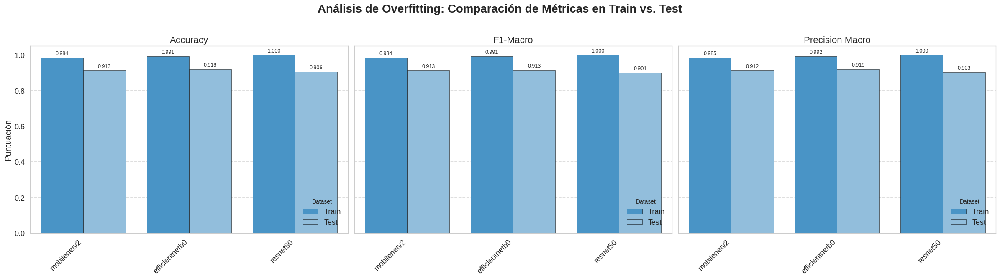

In [ ]:
def plot_detailed_train_test_bars(df_comparison, save_path):
    """
    Genera gráficos de barras comparando Train vs Test para cada una de las 3 métricas.
    """
    print("\n📊 Generando gráficos de barras detallados para análisis de Overfitting...")

    metrics_to_plot = ['Accuracy', 'F1-Macro', 'Precision Macro']

    plt.style.use('seaborn-v0_8-talk')
    fig, axes = plt.subplots(1, 3, figsize=(24, 7), sharey=True)
    fig.suptitle('Análisis de Overfitting: Comparación de Métricas en Train vs. Test', fontsize=20, fontweight='bold')

    for i, metric in enumerate(metrics_to_plot):
        ax = axes[i]

        df_metric = df_comparison[['Modelo', f'{metric} Train', f'{metric} Test']].copy()

        df_metric_melted = df_metric.melt(
            id_vars='Modelo',
            var_name='Dataset_Metric',
            value_name=metric
        )

        df_metric_melted['Dataset'] = df_metric_melted['Dataset_Metric'].apply(lambda x: 'Train' if 'Train' in x else 'Test')

        df_metric_melted[metric] = df_metric_melted[metric].astype(float)

        sns.barplot(
            data=df_metric_melted,
            x='Modelo',
            y=metric,
            hue='Dataset',
            palette={'Train': '#3498db', 'Test': '#85C1E9'},
            edgecolor='black',
            ax=ax
        )

        ax.set_title(f'{metric}', fontsize=16)
        ax.set_xlabel('')
        ax.set_ylabel('Puntuación' if i == 0 else '')
        ax.tick_params(axis='x', rotation=45)
        ax.legend(title='Dataset', loc='lower right')
        ax.grid(axis='y', linestyle='--', alpha=0.7)

        for label in ax.get_xticklabels():
            label.set_horizontalalignment('right')

        for container in ax.containers:
            ax.bar_label(container, fmt='%.3f', fontsize=9, padding=3)

    plt.ylim(0, 1.05)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])

    filename = os.path.join(save_path, 'overfitting_analysis_detailed_bars.png')
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    print(f"✅ Gráfico de overfitting detallado guardado en: {filename}")
    plt.show()
    plt.close()

plot_detailed_train_test_bars(df_comparison_detailed, PATH_RESULTS)

### **4.5 Creación de la tabla comparativa**


🎨 Creando tabla final con formato de publicación...
✅ Tabla de publicación detallada guardada en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/publication_table_final_detailed.png


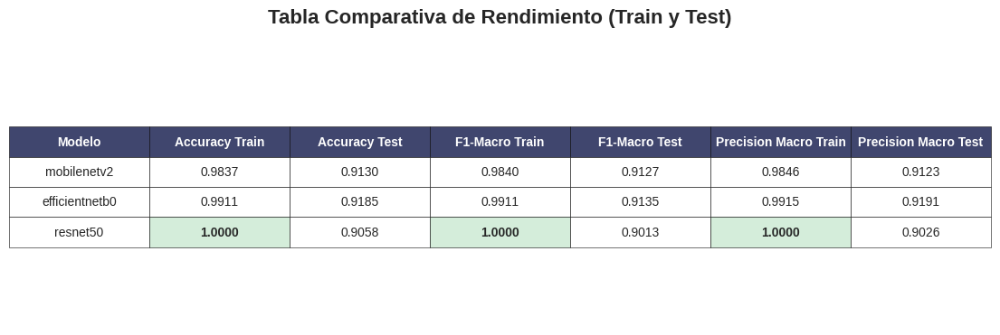

In [ ]:
def create_final_publication_table(df_comparison, save_path):
    print("\n🎨 Creando tabla final con formato de publicación...")
    fig, ax = plt.subplots(figsize=(14, 4))
    ax.axis('off')

    table = ax.table(
        cellText=df_comparison.values,
        colLabels=df_comparison.columns,
        cellLoc='center',
        loc='center',
    )
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 2)

    # Estilo y resaltado
    for (row, col), cell in table.get_celld().items():
        if row == 0:
            cell.set_text_props(weight='bold', color='white')
            cell.set_facecolor('#40466e')
        # Resaltar mejores valores en columnas de Test (columnas impares)
        if row > 0 and col % 2 != 0:
            col_values = df_comparison.iloc[:, col].astype(float)
            if float(cell.get_text().get_text()) == col_values.max():
                cell.set_facecolor('#d4edda') # Verde claro
                cell.set_text_props(weight='bold')

    ax.set_title('Tabla Comparativa de Rendimiento (Train y Test)', fontsize=16, fontweight='bold', pad=20)

    filename = os.path.join(save_path, 'publication_table_final_detailed.png')
    plt.savefig(filename, dpi=200, bbox_inches='tight', facecolor='white')
    print(f"✅ Tabla de publicación detallada guardada en: {filename}")
    plt.show()
    plt.close()

# Ejecutar la creación de la tabla final
create_final_publication_table(df_comparison_detailed, PATH_RESULTS)

### **4.6 Visualización Comparativa de Curvas**

In [ ]:
# ------------------------------------------------------------------------------
# Función 1: Curvas de Entrenamiento (Individual)
# ------------------------------------------------------------------------------
def plot_training_curves(history_tl, history_ft, model_name, save_path):
    """
    Genera y guarda las curvas de Accuracy y Loss para un modelo,
    distinguiendo las fases de Transfer Learning y Fine-Tuning.
    """
    # Combinar las métricas de ambas fases de entrenamiento
    acc = history_tl.history['accuracy'] + history_ft.history['accuracy']
    val_acc = history_tl.history['val_accuracy'] + history_ft.history['val_accuracy']
    loss = history_tl.history['loss'] + history_ft.history['loss']
    val_loss = history_tl.history['val_loss'] + history_ft.history['val_loss']

    epochs_tl = len(history_tl.history['accuracy'])
    total_epochs = len(acc)
    epochs_range = range(1, total_epochs + 1)

    plt.style.use('seaborn-v0_8-whitegrid')
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle(f'Curvas de Entrenamiento: {model_name}', fontsize=18, fontweight='bold')

    # --- Gráfico de Accuracy ---
    ax1.plot(epochs_range, acc, label='Training Accuracy', color='royalblue', lw=2)
    ax1.plot(epochs_range, val_acc, label='Validation Accuracy', color='darkorange', lw=2)
    ax1.axvline(x=epochs_tl, color='green', linestyle='--', label=f'Inicio Fine-Tuning (Época {epochs_tl})')
    ax1.axvspan(0.5, epochs_tl + 0.5, alpha=0.1, color='c', label='Fase TL')
    ax1.axvspan(epochs_tl + 0.5, total_epochs + 0.5, alpha=0.1, color='m', label='Fase FT')
    ax1.set_xlabel('Época', fontsize=12)
    ax1.set_ylabel('Accuracy', fontsize=12)
    ax1.set_title('Accuracy vs. Épocas', fontsize=14)
    ax1.legend(loc='lower right')
    ax1.set_ylim([min(min(acc), min(val_acc)) * 0.9, 1.0])

    # --- Gráfico de Loss ---
    ax2.plot(epochs_range, loss, label='Training Loss', color='royalblue', lw=2)
    ax2.plot(epochs_range, val_loss, label='Validation Loss', color='darkorange', lw=2)
    ax2.axvline(x=epochs_tl, color='green', linestyle='--', label=f'Inicio Fine-Tuning (Época {epochs_tl})')
    ax2.axvspan(0.5, epochs_tl + 0.5, alpha=0.1, color='c')
    ax2.axvspan(epochs_tl + 0.5, total_epochs + 0.5, alpha=0.1, color='m')
    ax2.set_xlabel('Época', fontsize=12)
    ax2.set_ylabel('Loss', fontsize=12)
    ax2.set_title('Loss vs. Épocas', fontsize=14)
    ax2.legend(loc='upper right')

    plt.tight_layout(rect=[0, 0, 1, 0.96])

    # Guardar la figura
    filename = os.path.join(save_path, f'curves_{model_name.lower()}.png')
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    print(f"✅ Curvas para '{model_name}' guardadas en: {filename}")
    plt.show()
    plt.close()

# ------------------------------------------------------------------------------
# Función 2: Gráfico de Barras Comparativo de Métricas
# ------------------------------------------------------------------------------
def plot_metrics_comparison(df_comparison, save_path):
    """
    Genera un gráfico de barras comparando las métricas finales de todos los modelos.
    Utiliza el DataFrame de comparación ya creado.
    """

    # Seleccionar solo las columnas relevantes
    cols_to_plot = ['Accuracy Test', 'F1-Macro Test', 'Precision Macro Test']

    # Convertir a float (por si están en string)
    df_plot = df_comparison.copy()
    for col in cols_to_plot:
        df_plot[col] = df_plot[col].astype(float)

    # Usar 'Modelo' como índice
    df_plot = df_plot.set_index('Modelo')[cols_to_plot]

    # Crear gráfico
    plt.style.use('seaborn-v0_8-talk')
    ax = df_plot.plot(
        kind='bar',
        figsize=(18, 9),
        width=0.8,
        rot=0,
        edgecolor='black',
        colormap='viridis'
    )

    # Añadir etiquetas sobre cada barra
    for container in ax.containers:
        ax.bar_label(container, fmt='%.4f', fontsize=10, fontweight='bold', padding=3)

    ax.set_title('Comparación de Métricas en el Conjunto de Test', fontsize=20, fontweight='bold', pad=20)
    ax.set_ylabel('Puntuación', fontsize=14)
    ax.set_xlabel('')
    ax.legend(title='Métricas', fontsize=12, bbox_to_anchor=(1.01, 1), loc='upper left')
    ax.grid(axis='y', linestyle='--', alpha=0.7)
    ax.set_ylim(0, df_plot.max().max() * 1.15)

    plt.tight_layout()

    # Guardar la figura
    filename = os.path.join(save_path, 'metrics_comparison_bars.png')
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    print(f"✅ Gráfico de barras comparativo guardado en: {filename}")
    plt.show()
    plt.close()

# ------------------------------------------------------------------------------
# Función 3: Orquestador Principal de Visualizaciones
# ------------------------------------------------------------------------------
def generate_all_visualizations(models_results, df_comparison, save_path):
    """
    Función principal que llama a todas las funciones de ploteo para generar
    los gráficos necesarios para el informe.

    Args:
        models_results (dict): Diccionario con las historias de entrenamiento.
        df_comparison (pd.DataFrame): DataFrame con la tabla comparativa de métricas.
        save_path (str): Ruta para guardar las figuras.
    """
    print("="*50)
    print("🎨 Iniciando la generación de todas las visualizaciones...")
    print("="*50)

    # 1. Generar curvas de entrenamiento individuales
    print("\n--- 1. Generando curvas de entrenamiento para cada modelo ---")
    for model_name, results in models_results.items():
        plot_training_curves(
            results['history_tl'],
            results['history_ft'],
            model_name,
            save_path
        )

    # 2. Generar gráfico de barras comparativo
    print("\n--- 2. Generando gráfico de barras comparativo de métricas ---")
    plot_metrics_comparison(df_comparison, save_path)

    print("\n\n✅ ¡Todas las visualizaciones han sido generadas y guardadas exitosamente!")
    print(f"📁 Los archivos se encuentran en: {save_path}")
    print("="*50)

🎨 Iniciando la generación de todas las visualizaciones...

--- 1. Generando curvas de entrenamiento para cada modelo ---
✅ Curvas para 'mobilenetv2' guardadas en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/curves_mobilenetv2.png


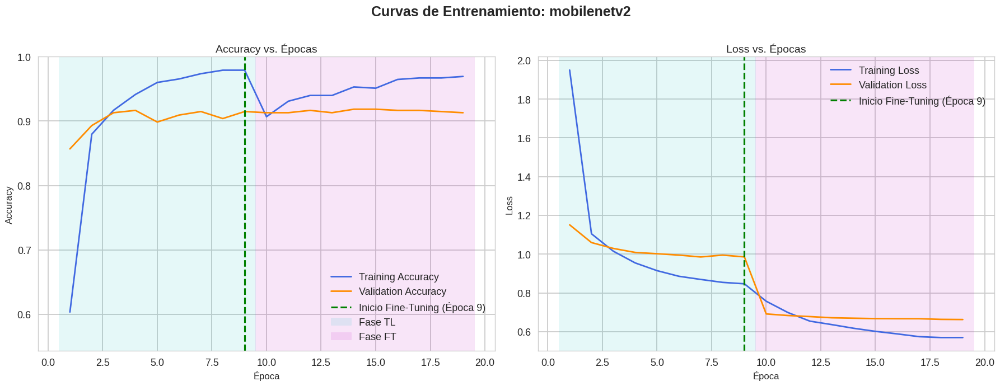

✅ Curvas para 'efficientnetb0' guardadas en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/curves_efficientnetb0.png


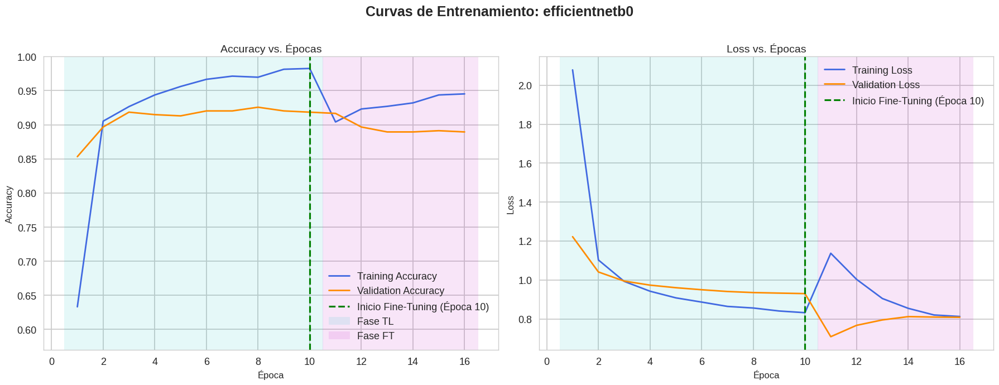

✅ Curvas para 'resnet50' guardadas en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/curves_resnet50.png


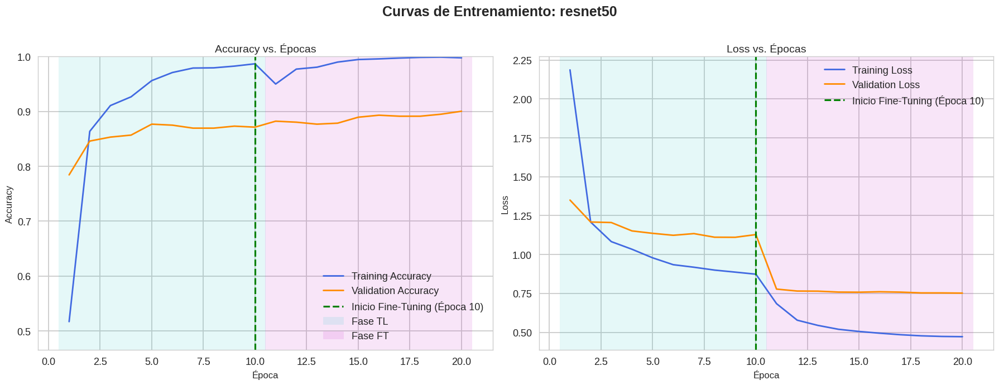


--- 2. Generando gráfico de barras comparativo de métricas ---
✅ Gráfico de barras comparativo guardado en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/metrics_comparison_bars.png


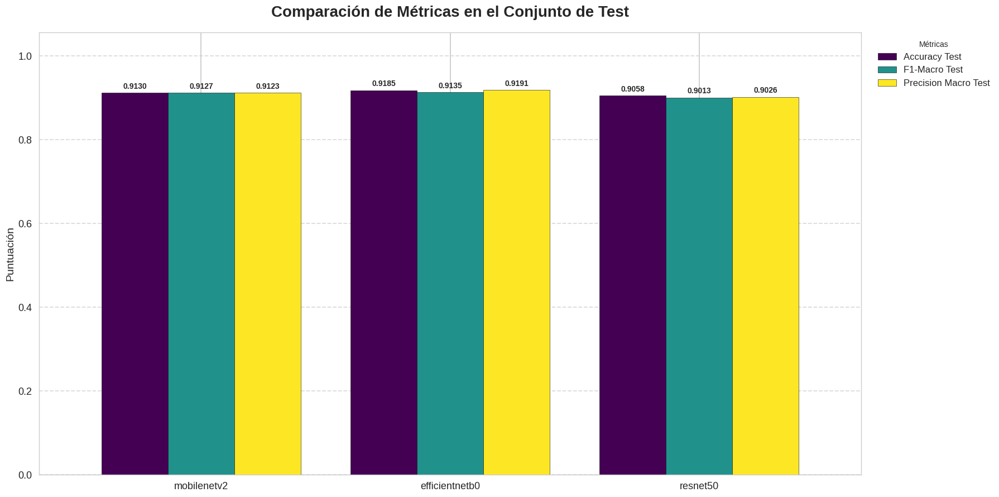



✅ ¡Todas las visualizaciones han sido generadas y guardadas exitosamente!
📁 Los archivos se encuentran en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/


In [ ]:
# Ejecutar la función principal para generar todas las visualizaciones
generate_all_visualizations(models_results, df_comparison_detailed, PATH_RESULTS)

###**4.7. Matriz de confusión**

In [ ]:
def analyze_confusion_matrices_and_top_misclassified_by_model(evaluation_results, ds_info, save_path):
    print("\n" + "="*60)
    print("📊 Analizando Matrices de Confusión y Clases Más Mal Clasificadas por Modelo...")
    print("="*60)

    class_names = ds_info.features['label'].names
    n_classes = len(class_names)
    all_confusion_matrices = {}
    top_misclassified_by_model = {}

    for model_name, results in evaluation_results.items():
        print(f"\n  - Procesando matriz de confusión y top misclasificaciones para {model_name}...")
        y_true = results['test']['y_true']
        y_pred = results['test']['y_pred']

        cm = confusion_matrix(y_true, y_pred)
        all_confusion_matrices[model_name] = cm

        cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
        cm_filename = os.path.join(save_path, f'confusion_matrix_{model_name}.csv')
        cm_df.to_csv(cm_filename)
        print(f"    ✅ Matriz de confusión para {model_name} guardada en: {cm_filename}")

        misclassified_per_class = np.sum(cm, axis=1) - np.diag(cm)

        top_misclassified_indices = np.argsort(misclassified_per_class)[::-1][:5]
        top_misclassified_classes_model = [class_names[i] for i in top_misclassified_indices]
        top_misclassified_counts_model = [misclassified_per_class[i] for i in top_misclassified_indices]

        summary_data_model = {
            'Clase': top_misclassified_classes_model,
            'Total clasificaciones erróneas': top_misclassified_counts_model
        }
        df_misclassification_summary_model = pd.DataFrame(summary_data_model)
        top_misclassified_by_model[model_name] = df_misclassification_summary_model

        print(f"\n  📋 TABLA RESUMEN - TOP 5 CLASES MÁS MAL CLASIFICADAS ({model_name}):")
        print(df_misclassification_summary_model.to_string(index=False))



    return all_confusion_matrices, top_misclassified_by_model

all_cms, top_misclassified_by_model_dfs = analyze_confusion_matrices_and_top_misclassified_by_model(evaluation_results_full, ds_info, PATH_RESULTS)


📊 Analizando Matrices de Confusión y Clases Más Mal Clasificadas por Modelo...

  - Procesando matriz de confusión y top misclasificaciones para mobilenetv2...
    ✅ Matriz de confusión para mobilenetv2 guardada en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/confusion_matrix_mobilenetv2.csv

  📋 TABLA RESUMEN - TOP 5 CLASES MÁS MAL CLASIFICADAS (mobilenetv2):
                 Clase  Total clasificaciones erróneas
     British_Shorthair                               5
            Abyssinian                               5
english_cocker_spaniel                               5
         saint_bernard                               3
                Birman                               3

  - Procesando matriz de confusión y top misclasificaciones para efficientnetb0...
    ✅ Matriz de confusión para efficientnetb0 guardada en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/confusion_matrix_efficientnetb0.csv

  📋 TABLA RE


📊 Generando visualizaciones de Matrices de Confusión...
✅ Heatmaps de Matrices de Confusión guardados en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/confusion_matrices_heatmap.png


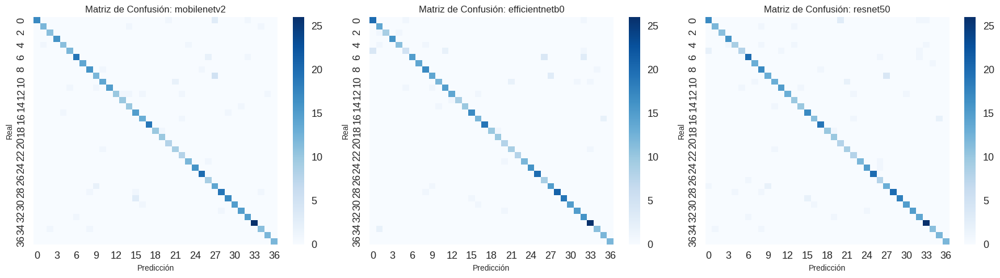

In [ ]:
def plot_confusion_matrices(confusion_matrices, class_names, save_path):
    print("\n" + "="*50)
    print("📊 Generando visualizaciones de Matrices de Confusión...")
    print("="*50)

    n_models = len(confusion_matrices)
    # Determine grid size for subplots (e.g., 1 row, n_models columns)
    fig, axes = plt.subplots(1, n_models, figsize=(6 * n_models, 5))

    if n_models == 1:
        axes = [axes] # Make it iterable if there's only one model

    for i, (model_name, cm) in enumerate(confusion_matrices.items()):
        ax = axes[i]
        sns.heatmap(cm, annot=False, fmt='d', cmap='Blues', ax=ax)
        ax.set_title(f'Matriz de Confusión: {model_name}', fontsize=12)
        ax.set_xlabel('Predicción', fontsize=10)
        ax.set_ylabel('Real', fontsize=10)
        # Optionally, set tick labels if desired, but with 37 classes it can be cluttered
        # ax.set_xticklabels(class_names, rotation=90, fontsize=8)
        # ax.set_yticklabels(class_names, rotation=0, fontsize=8)


    plt.tight_layout()
    filename = os.path.join(save_path, 'confusion_matrices_heatmap.png')
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    print(f"✅ Heatmaps de Matrices de Confusión guardados en: {filename}")
    plt.show()
    plt.close()

plot_confusion_matrices(all_cms, ds_info.features['label'].names, PATH_RESULTS)


🎨 Generando tablas visuales de Clases Más Mal Clasificadas por Modelo...
✅ Tabla de top misclasificados para mobilenetv2 guardada en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/top_misclassified_table_mobilenetv2.png


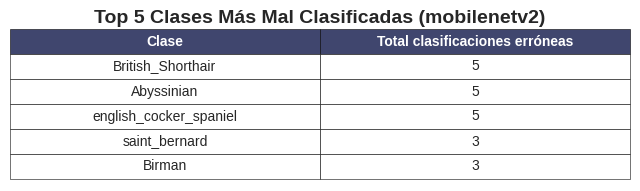

✅ Tabla de top misclasificados para efficientnetb0 guardada en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/top_misclassified_table_efficientnetb0.png


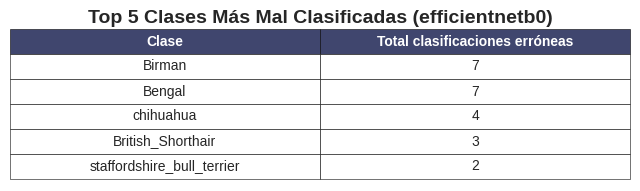

✅ Tabla de top misclasificados para resnet50 guardada en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/top_misclassified_table_resnet50.png


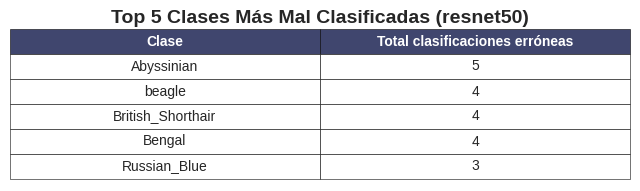

In [ ]:
def plot_top_misclassified_tables(top_misclassified_by_model_dfs, save_path):
    print("\n" + "="*50)
    print("🎨 Generando tablas visuales de Clases Más Mal Clasificadas por Modelo...")
    print("="*50)

    for model_name, df_summary in top_misclassified_by_model_dfs.items():
        fig, ax = plt.subplots(figsize=(8, 2))
        ax.axis('off')

        table = ax.table(
            cellText=df_summary.values,
            colLabels=df_summary.columns,
            cellLoc='center',
            loc='center',
        )
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1, 1.5)

        for (row, col), cell in table.get_celld().items():
            if row == 0:
                cell.set_text_props(weight='bold', color='white')
                cell.set_facecolor('#40466e')

        ax.set_title(f'Top 5 Clases Más Mal Clasificadas ({model_name})', fontsize=14, fontweight='bold', pad=1)

        filename = os.path.join(save_path, f'top_misclassified_table_{model_name.lower()}.png')
        plt.savefig(filename, dpi=200, bbox_inches='tight', facecolor='white')
        print(f"✅ Tabla de top misclasificados para {model_name} guardada en: {filename}")
        plt.show()
        plt.close()

plot_top_misclassified_tables(top_misclassified_by_model_dfs, PATH_RESULTS)

##**5. Análisis de Resultados y Evidencias de Inferencia**

###**5.1. Identificación del Modelo Ganador**

In [ ]:
# Identificar mejor modelo
best_model_idx = df_comparison_detailed['F1-Macro Test'].astype(float).idxmax()
best_model_name = df_comparison_detailed.iloc[best_model_idx]['Modelo']
print(f"\n🏆 Mejor modelo: {best_model_name}")



🏆 Mejor modelo: efficientnetb0


###**5.2. Evidencias de Inferencia**

✅ Evidencias (raw display) guardadas en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/inference_mobilenetv2_pretty.png


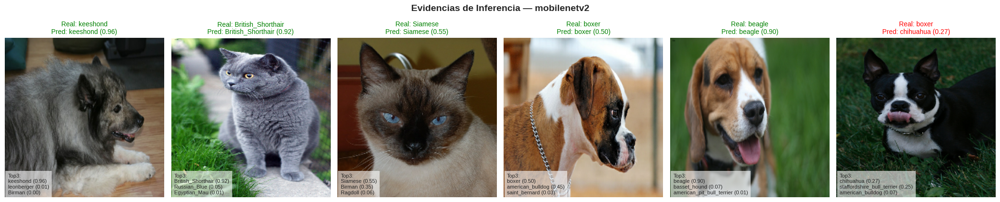

✅ Evidencias (raw display) guardadas en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/inference_efficientnetb0_pretty.png


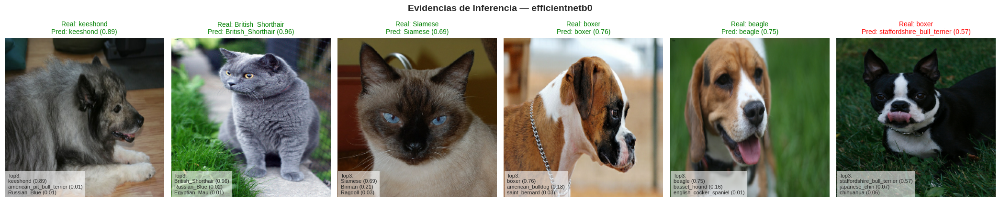

✅ Evidencias (raw display) guardadas en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/inference_resnet50_pretty.png


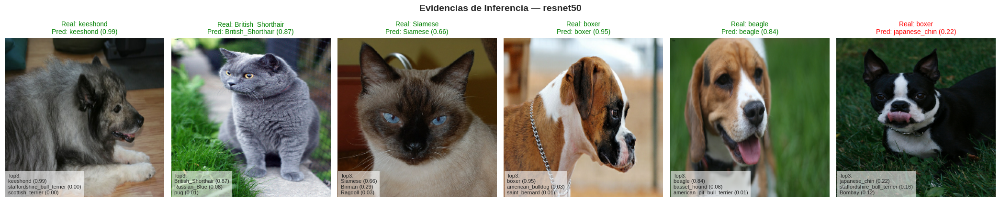

In [ ]:
def create_inference_evidence_pretty(model, ds_raw, backbone_name, ds_info, n_samples=6, save_path=PATH_RESULTS):
    """
    Muestra SIEMPRE la imagen 'raw' (solo redimensionada para display),
    pero hace la predicción con una copia preprocesada para el modelo.
    """
    # 1) Tomar n_samples imágenes del dataset crudo
    images_raw, labels = [], []
    for img, lbl in ds_raw.take(n_samples):
        images_raw.append(img.numpy())   # imágenes pueden tener tamaños distintos
        labels.append(lbl.numpy())
    labels = np.array(labels)

    # 2) Prepara dos copias: DISPLAY (raw+resize, [0,1]) y MODELO (preprocesada)
    display_imgs, model_imgs = [], []
    preprocess_fn = PREPROCESS_INPUT_MAP[backbone_name]

    for i in range(n_samples):
        # display
        disp = tf.image.resize(images_raw[i], IMG_SIZE)
        disp = tf.cast(disp, tf.float32) / 255.0
        display_imgs.append(disp.numpy())

        # modelo
        model_img = tf.cast(tf.image.resize(images_raw[i], IMG_SIZE), tf.float32)
        model_img = preprocess_fn(model_img)
        model_imgs.append(model_img.numpy())

    model_imgs = np.stack(model_imgs, axis=0)

    # 3) Predicciones
    preds = model.predict(model_imgs, verbose=0)     # (n, n_classes)
    top1  = np.argmax(preds, axis=1)
    conf1 = np.max(preds, axis=1)

    # (opcional) top-3
    top3_idx = np.argsort(preds, axis=1)[:, -3:][:, ::-1]
    top3_conf = np.take_along_axis(preds, top3_idx, axis=1)

    # 4) Plot bonito
    fig, axes = plt.subplots(1, n_samples, figsize=(3.5*n_samples, 4))
    if n_samples == 1:
        axes = [axes]

    class_names = ds_info.features['label'].names

    for i, ax in enumerate(axes):
        ax.imshow(display_imgs[i])
        ax.axis('off')

        true_id = int(labels[i])  # labels ya es vector de enteros
        pred_id = int(top1[i])
        correct = (true_id == pred_id)

        true_name = class_names[true_id]
        pred_name = class_names[pred_id]
        c1 = float(conf1[i])

        title = f"Real: {true_name}\nPred: {pred_name} ({c1:.2f})"
        ax.set_title(title, color=('green' if correct else 'red'), fontsize=10)

        for spine in ax.spines.values():
            spine.set_edgecolor('green' if correct else 'red')
            spine.set_linewidth(2.5)

        t3_names = [class_names[j] for j in top3_idx[i]]
        t3_conf  = [f"{top3_conf[i,k]:.2f}" for k in range(3)]
        ax.text(0.02, 0.02,
                "Top3:\n" + "\n".join([f"{t3_names[k]} ({t3_conf[k]})" for k in range(3)]),
                transform=ax.transAxes, fontsize=8,
                bbox=dict(facecolor='white', alpha=0.6, edgecolor='none'))

    plt.suptitle(f"Evidencias de Inferencia — {backbone_name}", fontsize=14, fontweight='bold', y=1.05)
    plt.tight_layout()

    filename = os.path.join(save_path, f'inference_{backbone_name.lower()}_pretty.png')
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    print(f"✅ Evidencias (raw display) guardadas en: {filename}")
    plt.show()
    plt.close()


# Uso por modelo (nota: crea el ds_test específico del backbone para inferir correctamente)
for name, data in models_results.items():
    test_ds_for_model = create_dataset(ds_test_raw, name, training=False)   # para iterar por batches con labels one-hot
    # pero para tomar imágenes "raw" con labels enteros, usa ds_test_raw directamente (ya lo tienes):
    create_inference_evidence_pretty(
        data['model'],
        ds_test_raw,          # <- dataset crudo original, as_supervised=True
        name,
        ds_info,
        n_samples=6,
        save_path=PATH_RESULTS
    )


###**5.3. Análisis de Errores**

✅ Análisis de errores guardado en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/error_analysis_mobilenetv2.png


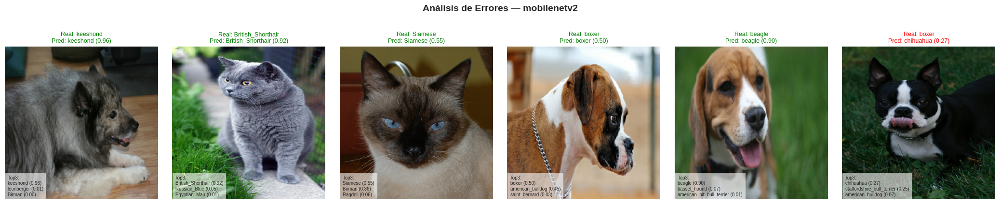

✅ Análisis de errores guardado en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/error_analysis_efficientnetb0.png


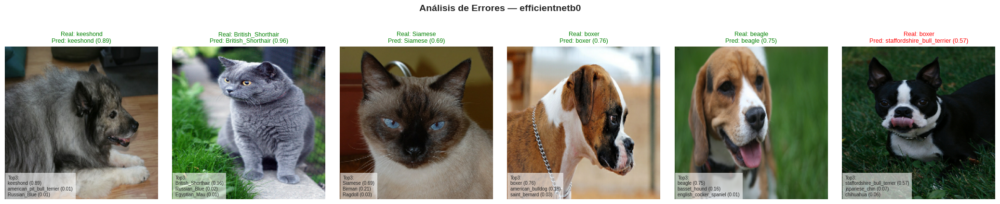

✅ Análisis de errores guardado en: /content/drive/MyDrive/PhawAI/DL_Proyecto_PalaciosDurand_Clasificacion/results/error_analysis_resnet50.png


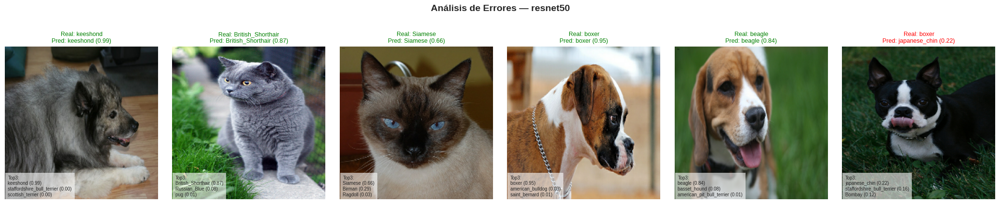

In [ ]:
def show_error_analysis(model, ds_raw, backbone_name, ds_info, n_samples=6, save_path=PATH_RESULTS):
    """
    Muestra ejemplos de aciertos y errores del modelo.
    - Usa siempre la imagen raw para visualización.
    - Predicciones con imágenes preprocesadas según el backbone.
    - Incluye Top-3 predicciones para analizar confusiones.
    """

    # 1) Recolectar un batch de imágenes raw y etiquetas
    images_raw, labels = [], []
    for img, lbl in ds_raw.take(n_samples*2):  # tomo más de lo que voy a mostrar
        images_raw.append(img.numpy())
        labels.append(lbl.numpy())
    labels = np.array(labels)

    # 2) Preparar inputs para el modelo
    preprocess_fn = PREPROCESS_INPUT_MAP[backbone_name]
    model_imgs, display_imgs = [], []

    for img in images_raw:
        # display (resize + normalizar a [0,1])
        disp = tf.image.resize(img, IMG_SIZE)
        disp = tf.cast(disp, tf.float32) / 255.0
        display_imgs.append(disp.numpy())

        # modelo (resize + preprocess_input)
        model_img = tf.cast(tf.image.resize(img, IMG_SIZE), tf.float32)
        model_img = preprocess_fn(model_img)
        model_imgs.append(model_img.numpy())

    model_imgs = np.stack(model_imgs, axis=0)

    # 3) Predicciones
    preds = model.predict(model_imgs, verbose=0)
    top1 = np.argmax(preds, axis=1)
    conf1 = np.max(preds, axis=1)

    # Top-3
    top3_idx = np.argsort(preds, axis=1)[:, -3:][:, ::-1]
    top3_conf = np.take_along_axis(preds, top3_idx, axis=1)

    # 4) Separar aciertos y errores
    correct_idx = np.where(labels == top1)[0]
    error_idx   = np.where(labels != top1)[0]

    # Seleccionamos hasta n_samples/2 de cada grupo
    n_show = n_samples // 2
    selected_idx = list(correct_idx[:n_show]) + list(error_idx[:n_show])

    # 5) Plot
    ncols = len(selected_idx)
    fig, axes = plt.subplots(1, ncols, figsize=(3.5*ncols, 4))

    if ncols == 1:
        axes = [axes]

    class_names = ds_info.features['label'].names

    for ax, i in zip(axes, selected_idx):
        ax.imshow(display_imgs[i])
        ax.axis('off')

        true_id = int(labels[i])
        pred_id = int(top1[i])
        correct = (true_id == pred_id)

        true_name = class_names[true_id]
        pred_name = class_names[pred_id]
        c1        = float(conf1[i])

        # título
        title = f"Real: {true_name}\nPred: {pred_name} ({c1:.2f})"
        ax.set_title(title, color=('green' if correct else 'red'), fontsize=9)

        # borde verde/rojo
        for spine in ax.spines.values():
            spine.set_edgecolor('green' if correct else 'red')
            spine.set_linewidth(2.5)

        # Top-3
        t3_names = [class_names[j] for j in top3_idx[i]]
        t3_conf  = [f"{top3_conf[i,k]:.2f}" for k in range(3)]
        ax.text(0.02, 0.02,
                "Top3:\n" + "\n".join([f"{t3_names[k]} ({t3_conf[k]})" for k in range(3)]),
                transform=ax.transAxes, fontsize=7,
                bbox=dict(facecolor='white', alpha=0.6, edgecolor='none'))

    plt.suptitle(
        f"Análisis de Errores — {backbone_name}",
        fontsize=14, fontweight='bold',
        y=1.05
    )
    plt.tight_layout(rect=[0, 0, 1, 0.95])

    filename = os.path.join(save_path, f'error_analysis_{backbone_name.lower()}.png')
    plt.savefig(filename, dpi=150, bbox_inches='tight')
    print(f"✅ Análisis de errores guardado en: {filename}")
    plt.show()
    plt.close()

for name, data in models_results.items():
    show_error_analysis(
        data['model'],
        ds_test_raw,     # dataset crudo para tomar imágenes
        name,
        ds_info,
        n_samples=10,    # muestra 6 correctos + 6 errores
        save_path=PATH_RESULTS
    )
